# 1. Install  Required Libraries

In [1]:
# To generate GIFs
!pip install imageio

In [2]:
!pip install -q visualkeras --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 997.4/997.4 kB 13.9 MB/s eta 0:00:00


In [3]:
!pip install -q tensorflow-docs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.7/182.7 kB 3.6 MB/s eta 0:00:00


# 2. Import Libraries

In [4]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.utils import image_dataset_from_directory
import random
import os
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.models import Sequential
import visualkeras
import warnings
warnings.simplefilter(action="ignore")
import time
import numpy as np
from PIL import Image as PilImage
from IPython.display import Image as IPyImage, display
import glob
import imageio
import tensorflow_docs.vis.embed as embed
import warnings
warnings.simplefilter(action="ignore")

2025-09-23 15:59:36.475291: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758643176.763027      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758643176.844664      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# 3. Explore Dataset

In [5]:
folder_path = "/kaggle/input/animefacedataset/images"

## 3.1. Check the pics in the dataset

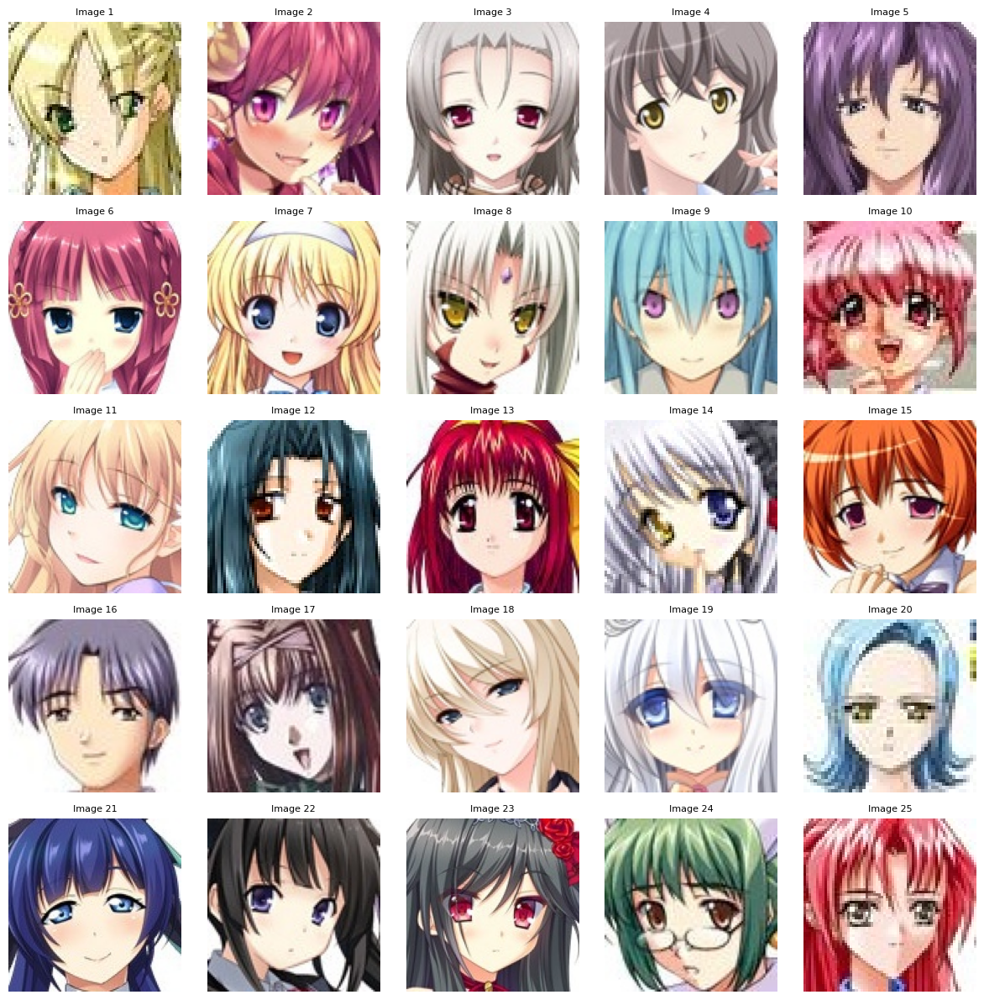

In [6]:
image_files = os.listdir(folder_path)[:25]  # Get first 25 images

plt.figure(figsize=(12, 12))  # Set figure size

for i, image_file in enumerate(image_files):
    img_path = os.path.join(folder_path, image_file)
    img = PilImage.open(img_path)
    
    plt.subplot(5, 5, i + 1)  # 5 rows, 5 columns
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Image {i+1}", fontsize=8)

plt.tight_layout()
plt.show()

## 3.2. Check the size of images

In [7]:
unique_sizes = set()

# Loop through all files in the dataset
for filename in os.listdir(folder_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
        try:
            img_path = os.path.join(folder_path, image_file)
            img = Image.open(img_path)
            width, height = img.size
            unique_sizes.add((width, height))
               
        except Exception as e:
                   print(f"Error processing {filename}: {e}")

print(unique_sizes)

# unique_sizes is a set of tuples like (width, height).

{(67, 67)}


## 3.3. Find min and max sizes based on image area

In [8]:
if unique_sizes:
    min_size = min(unique_sizes, key=lambda x: x[0] * x[1])
    max_size = max(unique_sizes, key=lambda x: x[0] * x[1])

    print(f"Unique image sizes: {unique_sizes}")
    print(f"Minimum image size: {min_size} (area: {min_size[0] * min_size[1]})")
    print(f"Maximum image size: {max_size} (area: {max_size[0] * max_size[1]})")
else:
    print("No valid images found.")

Unique image sizes: {(67, 67)}
Minimum image size: (67, 67) (area: 4489)
Maximum image size: (67, 67) (area: 4489)


# 4. Load Dataset

In [9]:
# workers = 2
# batch_size = 256
# image_size = 67

In [10]:
# Load dataset 
dataset = image_dataset_from_directory(
    folder_path,
    label_mode=None,
    image_size=(64, 64),  # Resize to 64×64 (it’s very close and commonly used in GANs).
    batch_size=256  
)

Found 63565 files.


I0000 00:00:1758643390.842407      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1758643390.843194      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


# 5. Normalize Images

In [11]:
def normalize_images(images):
    images = (tf.cast(images, tf.float32) - 127.5) / 127.5
    return images

# Apply preprocessing
dataset = dataset.map(normalize_images)


# Explanation:
# Why Use tf.cast?
# image_dataset_from_directory loads images as uint8 (0 to 255).
# We need to convert them to float32 for mathematical operations like division.

In [12]:
# For better performance:
dataset = dataset.shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

# 6. Define Generator

In [13]:
def make_generator_model():
    model = Sequential()

    # Input latent vector (100,) → Dense layer → Reshape to 4x4x1024 (starting feature map)
    model.add(layers.Dense(4*4*1024, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((4, 4, 1024)))
    assert model.output_shape == (None, 4, 4, 1024)

    # Upsample to 8x8
    model.add(layers.Conv2DTranspose(512, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 512)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Upsample to 16x16
    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 256)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Upsample to 32x32
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 32, 32, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Upsample to final size 64x64x3 for RGB image
    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 64, 64, 3)

    return model


In [14]:
seed_dimension = 100  # Define the size of the input seed, 100 is commonly used as a standard starting point in many GAN implementations.
model = make_generator_model()  # Build the generator model
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 16384)               │       1,638,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 16384)               │          65,536 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 4, 4, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 8, 8, 512)           │      13,107,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 16, 16, 256)         │       3,276,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 32, 32, 128)         │         819,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 64, 64, 3)           │           9,600 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,920,320 (72.18 MB)

 Trainable params: 18,885,760 (72.04 MB)

 Non-trainable params: 34,560 (135.00 KB)

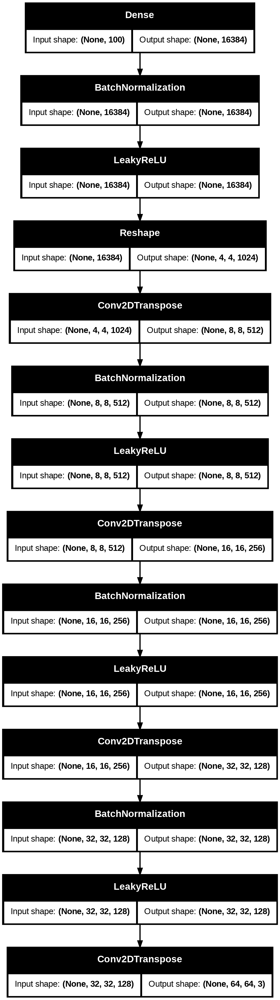

In [15]:
tf.keras.utils.plot_model(model, show_shapes=True)

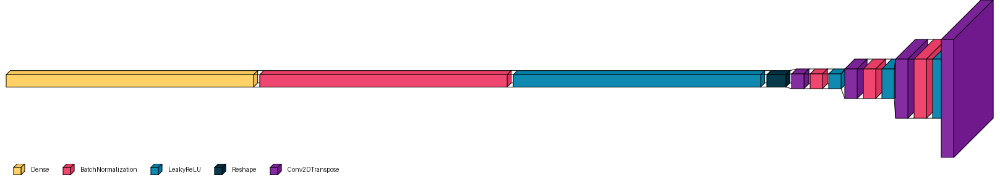

In [16]:
visualkeras.layered_view(model, scale_xy=3,  scale_z=0.03, legend=True)

## 6.1. Instantiate the generator

I0000 00:00:1758643395.367564      19 cuda_dnn.cc:529] Loaded cuDNN version 90300


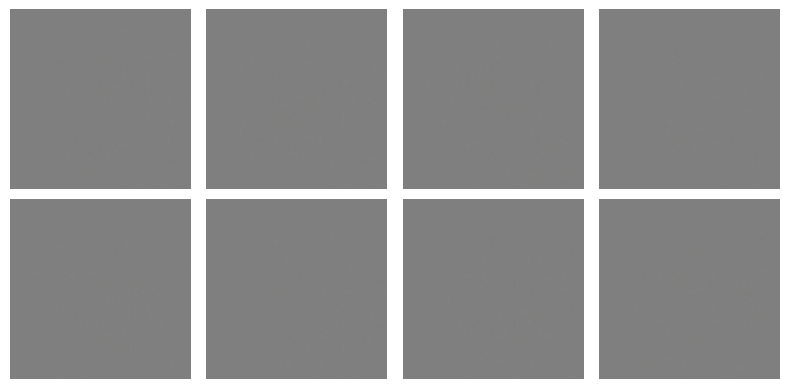

In [17]:
generator = make_generator_model()

# Generate 16 random noise vectors
noise = tf.random.normal([8, 100])
generated_images = generator(noise, training=False)
generated_images = (generated_images + 1) / 2.0  # Scale from [-1, 1] to [0, 1]

# Direct plotting (no function)
n_rows, n_cols = 2, 4
plt.figure(figsize=(n_cols * 2, n_rows * 2))

for i in range(n_rows * n_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    plt.imshow(generated_images[i])
    plt.axis("off")

plt.tight_layout()
plt.show()

# 7. Define Discriminator

In [18]:
from tensorflow.keras import Sequential, layers

def make_discriminator_model():
    model = Sequential()

    # Input: 64x64x3
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                            input_shape=(64, 64, 3)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # 32x32x64 → 16x16x128
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # 16x16x128 → 8x8x256
    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # 8x8x256 → 4x4x512
    model.add(layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten and output a single prediction (real/fake)
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))

    return model


In [19]:
seed_dimension = 100  
discriminator = make_discriminator_model()  
discriminator.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 32, 32, 64)          │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_8 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 128)         │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_9 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 8, 8, 256)           │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_10 (LeakyReLU)           │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 4, 4, 512)           │       3,277,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_11 (LeakyReLU)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,314,753 (16.46 MB)

 Trainable params: 4,314,753 (16.46 MB)

 Non-trainable params: 0 (0.00 B)

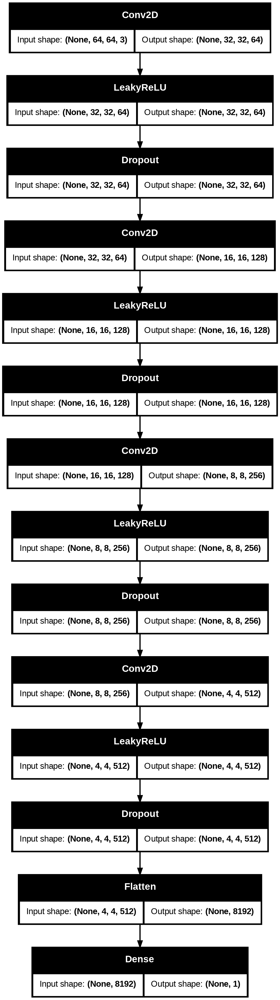

In [20]:
tf.keras.utils.plot_model(discriminator, show_shapes=True)

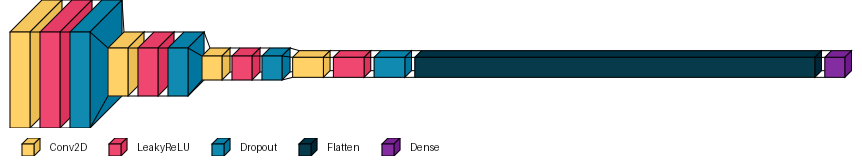

In [21]:
visualkeras.layered_view(discriminator, scale_xy=3,  scale_z=0.06, legend=True)

# 8. Define loss and optimizers

## 8.1. Discriminator loss

In [22]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)


def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

## 8.2. Generator loss

In [23]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

## 8.3. Generator Optimizer

In [24]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# 9. Training step

In [25]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

In [26]:
EPOCHS = 150
noise_dim = 100
num_examples_to_generate = 25
BATCH_SIZE = 256

In [27]:
# Seed for generating consistent image samples across epochs
seed = tf.random.normal([num_examples_to_generate, noise_dim])

# Helper: generate and save images at each epoch
def generate_and_save_images(model, epoch, test_input, out_dir="generated_images"):
    os.makedirs(out_dir, exist_ok=True)
    predictions = model(test_input, training=False)
    predictions = (predictions + 1) / 2.0  # back to [0,1]

    fig = plt.figure(figsize=(4,4))
    for i in range(predictions.shape[0]):
        plt.subplot(5, 5, i+1)
        plt.imshow(predictions[i])
        plt.axis("off")

    plt.tight_layout()
    plt.savefig(f"{out_dir}/image_epoch_{epoch:03d}.png")
    plt.close(fig)

# 10. Full training loop

In [28]:
# Call Training function for each epoch
def train(dataset, epochs):
    g_losses, d_losses = [], []

    for epoch in range(epochs):
        epoch_g, epoch_d = [], []

        for image_batch in dataset:
            # no .numpy() here (stays as tensors → faster)
            gen_loss, disc_loss = train_step(image_batch)
            epoch_g.append(gen_loss)
            epoch_d.append(disc_loss)

        # compute mean loss once at end of epoch
        g_loss = tf.reduce_mean(epoch_g)
        d_loss = tf.reduce_mean(epoch_d)

        g_losses.append(g_loss.numpy())
        d_losses.append(d_loss.numpy())

        # only save images every 2 epochs
        if (epoch + 1) % 2 == 0:
            generate_and_save_images(generator, epoch+1, seed)

            print(f"Epoch {epoch+1}, G_loss={g_loss:.4f}, D_loss={d_loss:.4f}")

    return g_losses, d_losses

In [29]:
# Train the GAN
g_losses, d_losses = train(dataset, EPOCHS)

E0000 00:00:1758643495.824361      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_2_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
E0000 00:00:1758643738.046170      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_2_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Epoch 2, G_loss=4.3325, D_loss=0.2340
Epoch 4, G_loss=3.9899, D_loss=0.3612
Epoch 6, G_loss=4.3361, D_loss=0.2518
Epoch 8, G_loss=4.2526, D_loss=0.2399
Epoch 10, G_loss=4.2723, D_loss=0.1751
Epoch 12, G_loss=5.0453, D_loss=0.2227
Epoch 14, G_loss=4.6950, D_loss=0.1545
Epoch 16, G_loss=5.0125, D_loss=0.1722
Epoch 18, G_loss=4.6842, D_loss=0.1739
Epoch 20, G_loss=6.1423, D_loss=0.1573
Epoch 22, G_loss=5.6590, D_loss=0.1387
Epoch 24, G_loss=5.5565, D_loss=0.1375
Epoch 26, G_loss=5.6723, D_loss=0.1205
Epoch 28, G_loss=6.0610, D_loss=0.1107
Epoch 30, G_loss=5.4392, D_loss=0.1238
Epoch 32, G_loss=5.7742, D_loss=0.1109
Epoch 34, G_loss=5.8798, D_loss=0.0996
Epoch 36, G_loss=5.7327, D_loss=0.1017
Epoch 38, G_loss=6.5615, D_loss=0.1013
Epoch 40, G_loss=6.6064, D_loss=0.1065
Epoch 42, G_loss=6.9000, D_loss=0.0939
Epoch 44, G_loss=6.8668, D_loss=0.0919
Epoch 46, G_loss=6.9002, D_loss=0.0893
Epoch 48, G_loss=6.7129, D_loss=0.0802
Epoch 50, G_loss=6.7974, D_loss=0.1384
Epoch 52, G_loss=7.0088, D_lo

# 11. Plot losses

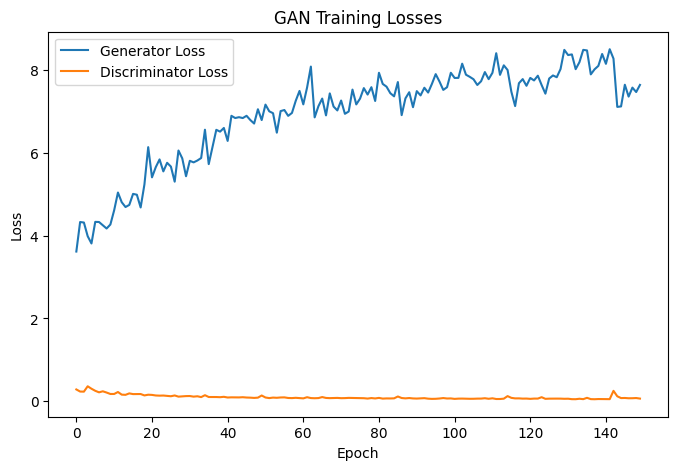

In [30]:
def plot_losses(g_losses, d_losses):
    plt.figure(figsize=(8,5))
    plt.plot(g_losses, label="Generator Loss")
    plt.plot(d_losses, label="Discriminator Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("GAN Training Losses")
    plt.show()

plot_losses(g_losses, d_losses)

# 12. Make Training GIF


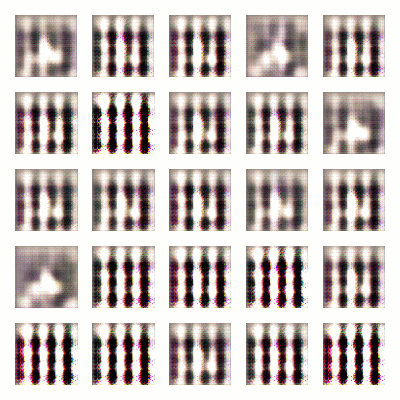

In [31]:
# Make training GIF and display inline
# Make training GIF and display inline
def create_and_show_gif(image_folder="generated_images", output_path="training.gif"):
    images = []
    for filename in sorted(glob.glob(f"{image_folder}/image_epoch*.png")):
        images.append(imageio.imread(filename))
    imageio.mimsave(output_path, images, fps=5)

    # Display inline in notebook using embed
    return embed.embed_file(output_path)

create_and_show_gif()